In [1]:
import sys
sys.path.append('../src/')
from xpcs import *
from sims import *
from plotting import *
from autocorrelations import *
import cv2
from scipy.special import erfinv
import pyopencl as cl
from pathlib import Path
import json
from scipy.fft import fft, ifft, fftfreq
import matplotlib.ticker as ticker


%matplotlib notebook

In [12]:
### User Defined
### This should be the only thing that needs to defined
CONFIG_FILE_NAME = "config_NPS_2_data_090825.json" #"config_B10_2_A7_data_071525.json"

figure_path = '/Users/eriklamb/Documents/Publications/NPS_Petra/Figures/'

### Scan In Config You Want to PreProcess ### 
Scans = np.array([219,334,552,579,709,779,796,868])

T = np.array([298,305,325,345,365,385,405,350])

# Extract Data

# G2s

<IPython.core.display.Javascript object>


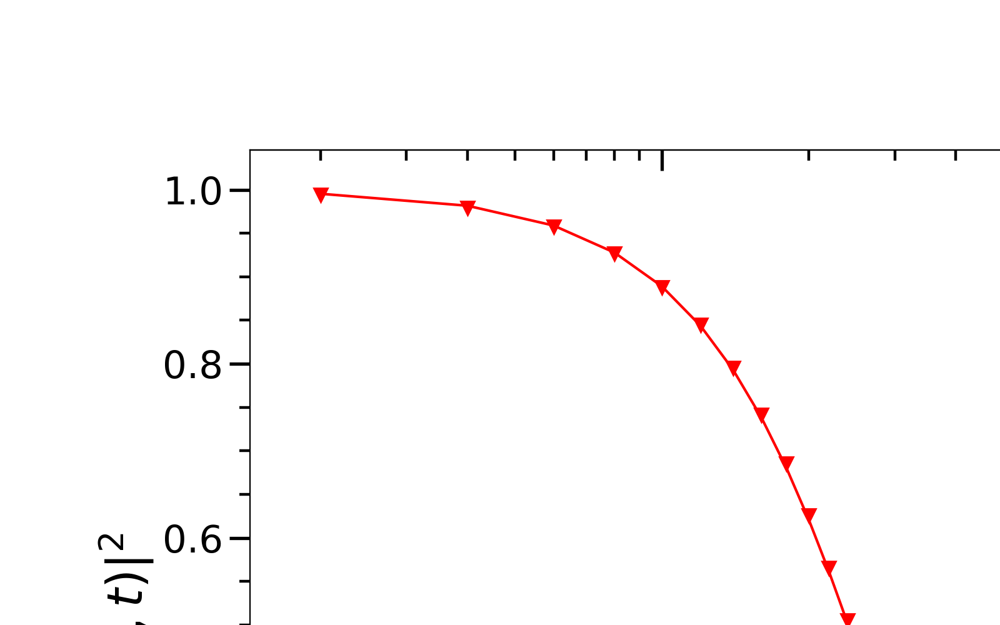

In [6]:



i=0

popt,pcov = curve_fit(g2_exp,delays,g2s[0,:],p0=[1,50,2])

plot_g2s(ax,delays,(g2s[0,:]-1)/popt[0],(g2_exp(delays,*popt)-1)/popt[0],'298K',marker_list[i],color_list[i])

In [ ]:
config_file = Path('/Users/eriklamb/Documents/Python/Projects/XPCS/configs/'+CONFIG_FILE_NAME)

# Open and load the JSON configuration file
with open(config_file, "r") as file:
    config = json.load(file)
 

<IPython.core.display.Javascript object>


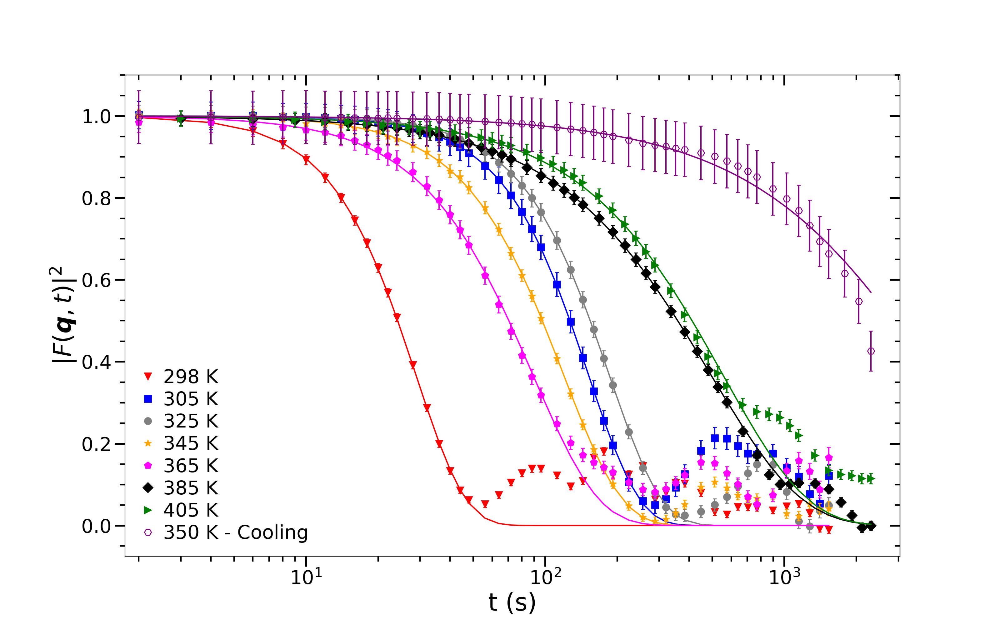

<IPython.core.display.Javascript object>


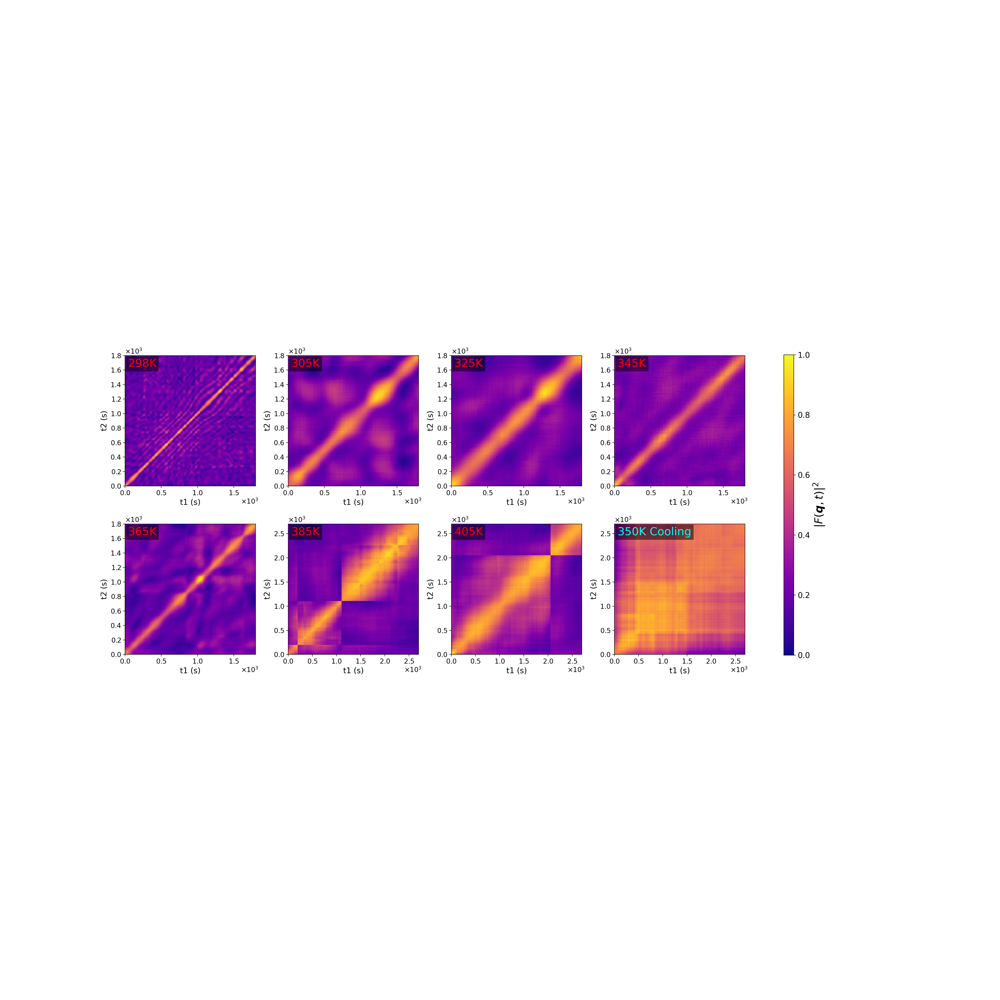

Min: -0.21582332253456116, Max: 1.0027371644973755
Min: -0.205917626619339, Max: 1.0836862325668335
Min: -0.2221195250749588, Max: 0.9722184538841248
Min: -0.2968205511569977, Max: 1.0621185302734375
Min: -0.2076214700937271, Max: 1.195107102394104
Min: -0.15337392687797546, Max: 0.8422211408615112
Min: -0.11317860335111618, Max: 0.8022355437278748
Min: 0.0, Max: 0.7623091340065002


In [14]:
config_file = Path('/Users/eriklamb/Documents/Python/Projects/XPCS/configs/'+CONFIG_FILE_NAME)

# Open and load the JSON configuration file
with open(config_file, "r") as file:
    config = json.load(file)
 

fig1,ax = plt.subplots(figsize=(16,10))

#TWO-TIME Plotting
fig2,axs = plt.subplots(2,4,figsize=(25,25))

##cmap = cm.Set2 # or any other colormap
#color_list = [cmap(i) for i in np.linspace(0, 1, avgG2.shape[0])] # num_colors is the desired number of colors
color_list = np.array(['red','blue','gray','orange','magenta','black','green','purple'])
marker_list = np.array(['v','s','o','*','p','D','>','H'])

#cmap = plt.cm.get_cmap('GnBu', len(T))
cmap = 'nipy_spectral'

#norm = mpl.colors.Normalize(vmin=T.min(), vmax=T.max())
#color_list = mpl.cm.ScalarMappable(norm=norm, cmap=cmap).to_rgba

#color_list = cmap(np.linspace(0, 1, len(T)+1))  # spread evenly across the colormap

POPT = np.zeros((Scans.shape[0],3))
PCOV = np.zeros((Scans.shape[0],3))

j = 0
k = 0

Temperatures = np.zeros(Scans.shape[0])

for i,s in enumerate(Scans):
        
    ### Load Work Paths ###
    BASE_DIR       = Path(config.get("Base"))
    dataset_path   = Path(config.get(f"{s}"))
    work_path      = BASE_DIR / dataset_path 
    processed_path = work_path / Path(config.get("Processed")) / Path(config.get(f"{s}_processed"))
    results_path   = work_path / Path(config.get("Results")) / Path(config.get(f"{s}_results"))

    ### Import Beamline Parameters ###
    ### Not user defined ###
    Compound = 'NPS'
    
    #Temperature Handled Differently Depending on Source 
    if 'B10' in Compound:
        Temperature = int(str(dataset_path)[21:27])/1000 #Temperature in Kelvin
    if 'NPS' in Compound:
        Temperature = int(config.get(f"{s}_temperature")) #Temperature in Kelvin
        
    Temperatures[i] = int(Temperature)
        
    #Load file
    with h5py.File(results_path, 'r') as DATA:
        g2s = DATA['XPCS/G2_Results'][:]
        g2_errs = DATA['XPCS/G2_error'][:]
        delays = DATA['XPCS/delays'][:]
        dQ = DATA['XPCS/dQ'][:]
        As = DATA['XPCS/As'][:][0]
        aas = DATA['XPCS/aas'][:][0]

       # Cs = DATA['XPCS/Cs'][:]
        taus = DATA['XPCS/taus'][:][:]
        betas = DATA['XPCS/betas'][:][:]
        taus_err = DATA['XPCS/taus_err'][:][:]
        betas_err = DATA['XPCS/betas_err'][:][:]
        
        #TwoTime
        TwoTime = DATA['XPCS/TwoTime'][:]
        #print(TwoTime.shape)
        TwoTime_extent = DATA['XPCS/TwoTime_extent'][:]
        
        #print(As)
        truncs = -5
        # Fit
        if Temperature==385:
            truncs = -12
        if Temperature==405:
            truncs = -10
        if Temperature==350:
            truncs = -16  #-16
        if Temperature==365:
            truncs = -22
        if Temperature==298:
            truncs = -30
        if Temperature==305:
            truncs = -17
        if Temperature==345:
            truncs = -18
        if Temperature==325:
            truncs = -16
        
        #popt, pcov = curve_fit(g2_two_tau, delays[0,:truncs],g2s[best_ind[i],:truncs], p0=[As,aas,taus[0],taus[1],betas[0],betas[1]],bounds=(lower_bounds, upper_bounds))

        popt, pcov = curve_fit(g2_exp, delays[0,:truncs],g2s[0,:truncs], p0=[As,taus[0],betas[0]])

            
        POPT[i,:]+=popt
        PCOV[i,:]+=np.sqrt(np.diag(pcov))
        

        # --- sizes ---
        ax.tick_params(which='major', length=7, width=1.6, labelsize=18)
        ax.tick_params(which='minor', length=4, width=1.2)

        # --- directions per side ---
        # x: top IN, bottom OUT (two calls so we don't overwrite the other side)
        ax.tick_params(axis='x', which='both',direction='in', top=True)
        ax.tick_params(axis='x', which='both',direction='out', bottom=True)

        # y: right IN, left OUT
        ax.tick_params(axis='y', which='both',direction='out', right=True)
        ax.tick_params(axis='y', which='both',direction='out', left=True)





        ax.set_ylabel(r'$|F(\boldsymbol{q},t)|^2$', fontsize=28)
        ax.set_xlabel('t (s)',fontsize=28) 

        if Temperature==350:
            ax.semilogx(delays[0,:],((g2s[0,:]-1)/popt[0])[:],marker_list[i],markersize=8,markerfacecolor='none', markeredgecolor=color_list[i],label=f'{int(Temperatures[i])} K - Cooling')
        else:
            ax.semilogx(delays[0,:],((g2s[0,:]-1)/popt[0])[:],marker_list[i],markersize=8,color=color_list[i],label=f'{int(Temperatures[i])} K')
        ax.errorbar(delays[0,:],((g2s[0,:]-1)/popt[0])[:], yerr=g2_errs[0,:],fmt='none',capsize=2,color=color_list[i])
        #ax.semilogx(delays[0,:],((g2_two_tau(delays[0,:],*popt)-1)/popt[0])[:],'-',color=color_list[i])
        ax.semilogx(delays[0,:],((g2_exp(delays[0,:],*popt)-1)/popt[0])[:],'-',color=color_list[i])
        ax.set_xlim(1.75, 3050)
        #ax.legend(loc='lower left',fontsize=18)
        ax.set_ylim(bottom=-0.075)  # sets the lower limit to 0
        ax.set_ylim(top=1.1)  # sets the upper limit to 1.1

        leg = ax.legend(frameon=False,          # remove box
                handletextpad=0.3,      # space between marker and text
                handlelength=1.0,       # length of legend handle
                labelspacing=0.2,       # vertical spacing between entries
                borderpad=0.2,          # padding inside the legend area
                fontsize=22,
                loc='lower left')       # or wherever you want
        

        
        
        
        
        print(f'Min: {np.min(TwoTime)}, Max: {np.max(TwoTime)}')
 
        #vmin = -0.22776,vmax = 1.2771

        if i==4:
            k=0
        if i>3:
            j=1

        TwoTime_norm = (TwoTime-np.min(TwoTime))/(np.max(TwoTime)-np.min(TwoTime))
        im = axs[j,k].imshow(TwoTime_norm,origin="lower",extent=np.array(TwoTime_extent),vmin = 0,vmax = 1,cmap='plasma')
        axs[j,k].set_ylabel('t2 (s)',fontsize=14)
        axs[j,k].set_xlabel('t1 (s)',fontsize=14)
        
        #Tlabel = f'{T[i]} K'
        if Temperatures[i] != 350:
            Tlabel = f'{int(Temperatures[i])}K'
            color_label = 'red'
        if Temperatures[i] == 350:
            Tlabel = f'{int(Temperatures[i])}K Cooling'
            color_label = 'cyan'
            
        axs[j,k].text(0.024, 0.978, Tlabel, color=color_label, fontsize=20,
              ha='left', va='top', transform=axs[j,k].transAxes,
              bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        
        #if TT==350:
          #  axs[j,k].set_title(f'{T[i]} K, Cooling',fontsize=24)
        #else:
         #   axs[j,k].set_title(f'{T[i]} K' ,fontsize=24)


        #axs[j,k].xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x/1e3:.1f}"))
        #axs[j,k].yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: f"{y/1e3:.1f}"))

        axs[j,k].xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
        axs[j,k].xaxis.get_offset_text().set_fontsize(12)  # Adjust font size if needed
        axs[j,k].xaxis.get_offset_text().set_position((1.02, 0))  # Move offset label slightly

        axs[j,k].yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
        axs[j,k].yaxis.get_offset_text().set_fontsize(12)
        axs[j,k].yaxis.get_offset_text().set_position((0, 1.02))  # Move offset label slightly

        axs[j,k].ticklabel_format(axis='both', style='sci', scilimits=(0, 0))  # Force scientific notation

        axs[j,k].tick_params(axis='both', which='major', labelsize=12)
        axs[j,k].tick_params(axis='both', which='minor', labelsize=12)


        k+=1


        plt.subplots_adjust(wspace=0.25, hspace=-0.72)
        #plt.tight_layout(pad=0.1)


        
        
# ... your plotting loop adds lines/points to ax ...
# after plotting (and after set_xscale('log') etc.), call once:
axt, axr = asymmetric_ticks(ax)
        
# Flatten axs to a list in case it's 2D (like axs[2,4])
cbar = fig2.colorbar(im, ax=axs.ravel().tolist(),shrink=0.39, aspect=30)
cbar.set_label(r'$|F(\boldsymbol{q},t)|^2$', fontsize=20)
cbar.ax.tick_params(labelsize=14)
        #ax.semilogx(delays[0,:],g2s[0,:],'.-')

fig1.savefig(figure_path+"isf.pdf",format="pdf",bbox_inches="tight")

fig2.savefig(figure_path+"twotime.pdf",format="pdf",bbox_inches="tight")

<IPython.core.display.Javascript object>


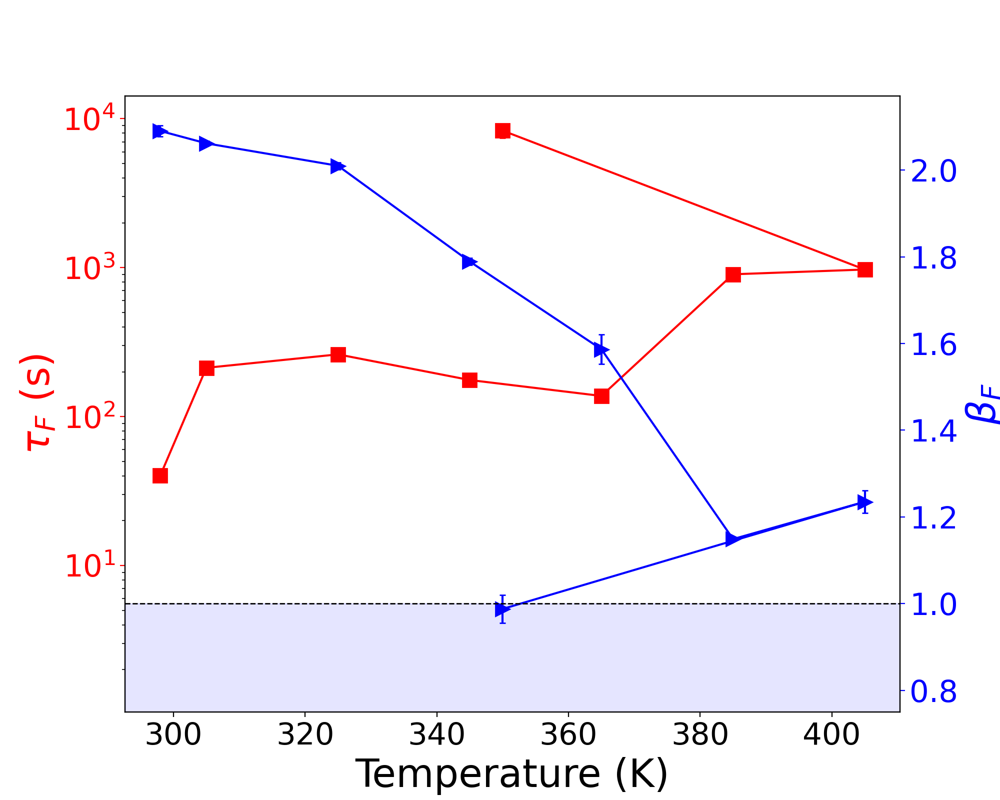

In [15]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(10,8))

# First dataset: Red markers and error bars
ax.semilogy(Temperatures, POPT[:,1], 's-', color='r', markersize=10, label=r'$\tau_{F}$')
ax.errorbar(Temperatures, POPT[:,1], yerr=PCOV[:,1], fmt='none', capsize=2, color='r')

ax.set_ylabel(r'$\tau_{F}$ (s)', color='red', fontsize=28)
ax.set_xlabel('Temperature (K)', fontsize=28)

# Adjust red y-axis properties
ax.tick_params(axis='y', colors='red')
ax.tick_params(axis='both', which='major', labelsize=22)
ax.tick_params(axis='both', which='minor', labelsize=22)
#ax.spines['left'].set_color('red')

# Second y-axis for the second dataset
ax2 = ax.twinx()

# Second dataset: Blue markers and error bars
ax2.plot(Temperatures, POPT[:,2], '>-', color='b', markersize=10, label=r'$\beta_{F}$')
ax2.errorbar(Temperatures, POPT[:,2], yerr=PCOV[:,2], fmt='none', capsize=2, color='b')

ax2.set_ylabel(r'$\beta_{F}$', color='blue', fontsize=28)

# Adjust blue y-axis properties
ax2.tick_params(axis='y', colors='blue')
ax2.tick_params(axis='both', which='major', labelsize=22)
ax2.tick_params(axis='both', which='minor', labelsize=22)
#ax2.spines['right'].set_color('blue')

# **Shade the entire bottom half of the figure**
ax2.axhspan(ymin=0.75, ymax=1, color='blue', alpha=0.1)  # Extends fully across x-domain

# **Add a dashed horizontal line at beta = 1**
ax2.axhline(y=1, linestyle='--', color='black', linewidth=1)
ax2.set_ylim(0.75, ax2.get_ylim()[1])


plt.show()

fig.savefig(figure_path+"tau_beta.pdf",format="pdf",bbox_inches="tight")
